# Extra exercise

### Perform these tasks:

#### Network descriptives:

#### Import dataset in package of your choice
- Calculate number of nodes, number of edges, density
- Calculate degree and plot degree distribution
- Describe degree distribution properties
- Calculate betweenness if appropriate
- Identify the nodes with the highest degree and betweenness
- Network structure, visualization and layout

#### Calculate the connected components
- Plot the network and identify the nodes with the highest centrality
- Identify the role or importance of central nodes for the structure or layout

#### Remove the nodes with the highest centrality and rerun the plot.
- Describe what has happened?
- How many nodes do you have to remove before the network structure starts to collapse?


In [1]:
# Import of required libraries and packages
import igraph as ig
from matplotlib import pyplot as plt
import numpy as np



def get_attributes(g):
    print("Attribute of node: %s. Attribute of edge: %s"%(g.vs.attribute_names(), g.es.attribute_names()))
    print("Number of nodes: %d. Number of edges: %d" %(g.vcount(), g.ecount()))
    print("Fully connected: Lmax = %d. "%(g.vcount()*(g.vcount()-1)/2))
    print("Desity: %f" %(g.ecount()/(g.vcount()*(g.vcount()-1)/2)))

def plot_dist(g):
    print(max(g.degree()))
    hist,bins=np.histogram(g.degree(),bins=np.linspace(0,20,20))
    print(hist)
    print(bins) 
    fig, ax = plt.subplots(figsize=(16, 7))
    ax.plot(bins[1:],hist)
    ax.set_xlabel('Degree')  # Add an x-label to the axes.
    ax.set_ylabel('Counts')  # Add a y-label to the axes.
    ax.set_title("Distribution of degree")  # Add a title to the axes.

def degree_betweenness(g):
    print("Betweeness: minimum: % .2f, maximum: % .4f" %(min(betweenness),max(betweenness)))
    print("Number of degrees calculated : % 2d, minimum : % 2d, maximim : % 2d" %(len(degree), min(degree), max(degree)))
    print("Average path length: % .2f" %g.average_path_length())
    ## closeness of nodes
    cls = g.closeness()
    # Local clustering coefficient: transitivity coefficient, measure the porbablity that two points are connected(degree existing or not)
    trans = g.transitivity_local_undirected()
    #print(trans)
    fig = plt.figure(figsize=(16, 7))
    plt.scatter(degree, betweenness, marker='^', c = "g")
    plt.xlabel("Degree")
    plt.ylabel("Betweenness")
    plt.show()
    
def plot_graph(elecnet, max_d = -1, max_e = -1):
    
    vcolor = ["gold"]*elecnet.vcount()
    vsize = [8]*elecnet.vcount()
    vlsize = [3]*elecnet.vcount()

    if(max_d != -1):
        vcolor[max_d] = "green"
        vsize[max_d] = 25
        vlsize[max_d] = 10
    if(max_e != -1):    
        vcolor[max_e] = "blue"
        vsize[max_e] = 25
        vlsize[max_e] = 10


    #Define style from network plotting
    visual_style = {}
    visual_style["vertex_size"] = vsize
    visual_style["vertex_label_size"]= vlsize
    visual_style["vertex_color"] = vcolor
    visual_style["vertex_label"] = elecnet.vs["id"]
    visual_style["edge_width"] = 1
    visual_style["layout"] = layout
    visual_style["bbox"] = (600, 600)
    visual_style["margin"] = 30

    return ig.plot(elecnet, "graph.svg", **visual_style)

def drop(graph, num_drop, typ):
    drop = []
    num_cluster = []
    for i in range(num_drop):
        if(typ == "d"):
            max_item = max(graph.degree())
            drop.append(str([graph.vs[idx] for idx, item in enumerate(graph.degree()) if(item == max_item)]).split(',')[1])
        elif(typ == "b"):
            max_item = max(graph.betweenness())
            drop.append(str([graph.vs[idx] for idx, item in enumerate(graph.betweenness()) if(item == max_item)]).split(',')[1])
        graph.delete_vertices(int(drop[i]))
        num_cluster.append(len(graph.clusters()))
    return num_cluster
    


In [2]:
#filename = easygui.fileopenbox()
filename = "power.gml"
print(filename)

elecnet = ig.Graph.Read_GML(filename)

ig.summary(elecnet)

power.gml
IGRAPH U--- 4941 6594 -- 
+ attr: id (v)


In [261]:
#check if the graph is weighted graph
elecnet.is_weighted()

False

**Calculate number of nodes, number of edges, density**

In [295]:
# Get the attributes and the number of nodes
get_attributes(elecnet)

Attribute of node: ['id']. Attribute of edge: []
Number of nodes: 4941. Number of edges: 6594
Fully connected: Lmax = 12204270. 
Desity: 0.000540


**Calculate degree and plot degree distribution**

**Describe degree distribution properties**

- Degree distribution of Power plants network are mostly low (within 10), only a few of them have higher degree

19
[1226 1656 1060  401  252  137   84   46   27   26   11    5    5    3
    0    0    0    1    1]
[ 0.          1.05263158  2.10526316  3.15789474  4.21052632  5.26315789
  6.31578947  7.36842105  8.42105263  9.47368421 10.52631579 11.57894737
 12.63157895 13.68421053 14.73684211 15.78947368 16.84210526 17.89473684
 18.94736842 20.        ]


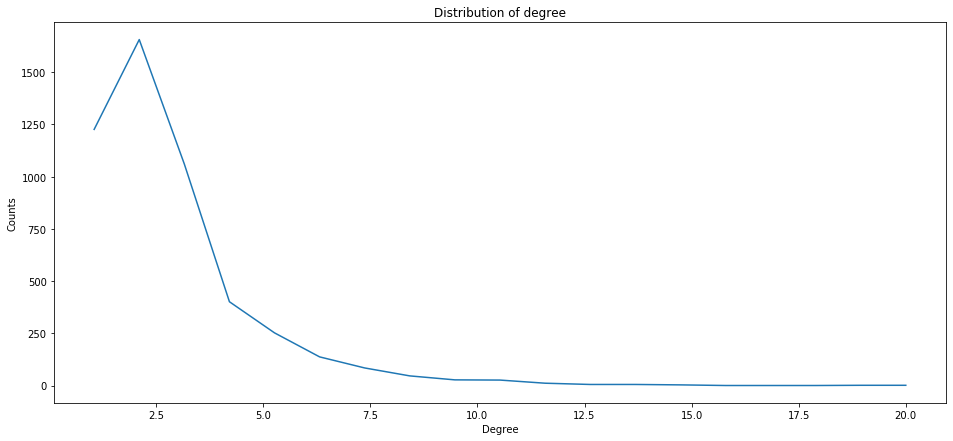

In [299]:
plot_dist(elecnet)

**Calculate betweenness if appropriate**

Betweeness: minimum:  0.00, maximum:  3518477.3436
Number of degrees calculated :  4941, minimum :  1, maximim :  19
Average path length:  18.99


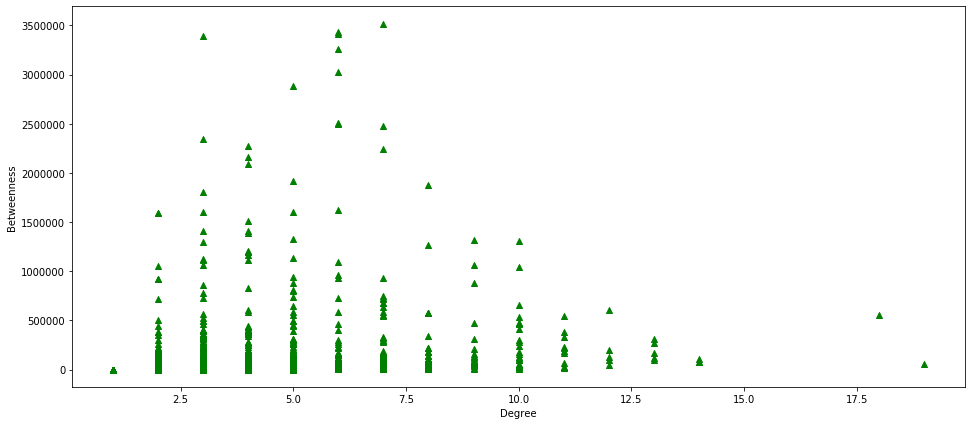

In [300]:
# Calculate centrality measures
degree_betweenness(elecnet)



**Identify the nodes with the highest degree and betweenness**

In [301]:
max_b = max(elecnet.betweenness())
for idx, b in enumerate(elecnet.betweenness()):
    if(b == max_b):
        print(elecnet.vs[idx])

igraph.Vertex(<igraph.Graph object at 0x1a2dea3048>, 4164, {'id': 4164.0})


In [302]:
max_d = max(elecnet.degree())
for idx, d in enumerate(elecnet.degree()):
    if(d == max_d):
        print(elecnet.vs[idx])

igraph.Vertex(<igraph.Graph object at 0x1a2dea3048>, 2553, {'id': 2553.0})


**Network Visualization**

In [4]:
layout = elecnet.layout("drl")

In [414]:

#Define style from network plotting
plot_graph(elecnet)

### Calculate the connected components

- Plot the network and identify the nodes with the highest centrality
- Identify the role or importance of central nodes for the structure or layout

In [5]:
plot_graph(elecnet, 2553, 4164)

### Remove the nodes with the highest centrality and rerun the plot.



- Describe what has happened?
- How many nodes do you have to remove before the network structure starts to collapse?

**Deletion of highest degree vertices**

- first deletion caused a seperation of the whole power gird into two cluster
- following dropout increases the grid into pieces

In [380]:
## number of clusters before dropping
len(elecnet.clusters())

1

In [417]:
# drop the 20 largest degree vertices
num_cluster_drop_max_degree = drop(elecnet, 20, 'd')
num_cluster_drop_max_degree

[2, 9, 18, 25, 25, 27, 28, 32, 32, 33, 39, 40, 44, 45, 48, 49, 50, 51, 53, 53]

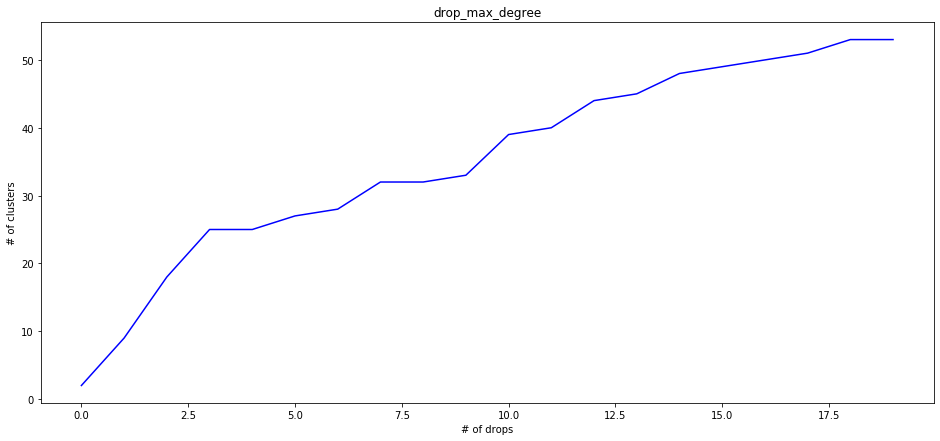

In [426]:
fig = plt.figure(figsize=(16, 7))
plt.plot(num_cluster_drop_max_degree, c = "b")
plt.xlabel("# of drops")
plt.ylabel("# of clusters")
plt.title("drop_max_degree")
plt.show()

**Deletion of highest betweenness vertices**

- first seperation of the whole power gird into two clusters occurs after five drops
- betweenness in power grid does not seem to be that essential 

In [421]:
# drop the 20 largest degree vertices
num_cluster_drop_max_betweenness = drop(elecnet, 20, 'b')
num_cluster_drop_max_betweenness

[1, 1, 1, 1, 1, 1, 2, 4, 4, 5, 7, 7, 7, 7, 9, 9, 10, 11, 11, 15]

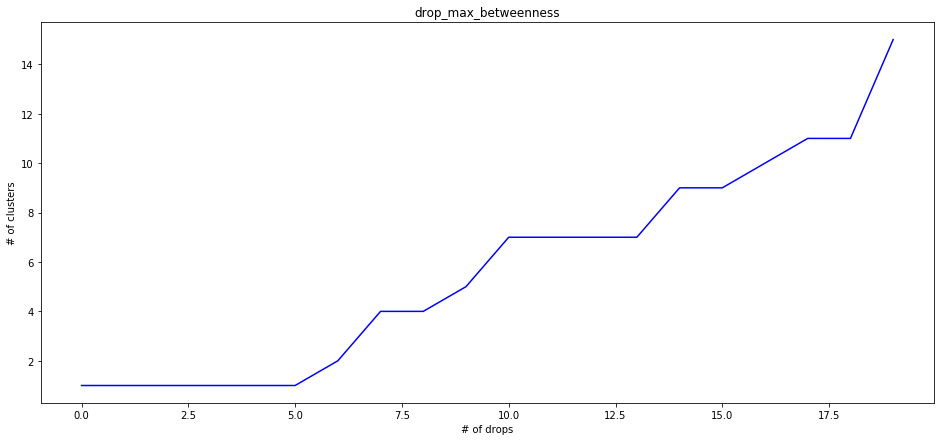

In [425]:
fig = plt.figure(figsize=(16, 7))
plt.plot(num_cluster_drop_max_betweenness, c = "b")
plt.xlabel("# of drops")
plt.ylabel("# of clusters")
plt.title("drop_max_betweenness")
plt.show()